# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
from matplotlib import pyplot as plt
import numpy as np
from matplotlib import patches

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "5"

%matplotlib inline

2022-11-19 19:54:39.669047: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-19 19:54:41.044460: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-11-19 19:54:41.664111: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-11-19 19:54:41.664149: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if yo

In [9]:
# Make total dataset
dataset = None
test_files = os.listdir("data/test")
for t in test_files:
    i_data = get_dataset(f"data/test/{t}")
    if dataset is None:
        dataset = i_data
    else:
        dataset = dataset.concatenate(i_data)

INFO:tensorflow:Reading unweighted datasets: ['data/test/segment-11918003324473417938_1400_000_1420_000_with_camera_labels.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/test/segment-11918003324473417938_1400_000_1420_000_with_camera_labels.tfrecord']
INFO:tensorflow:Number of filenames to read: 1
INFO:tensorflow:Reading unweighted datasets: ['data/test/segment-11718898130355901268_2300_000_2320_000_with_camera_labels.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/test/segment-11718898130355901268_2300_000_2320_000_with_camera_labels.tfrecord']
INFO:tensorflow:Number of filenames to read: 1
INFO:tensorflow:Reading unweighted datasets: ['data/test/segment-11799592541704458019_9828_750_9848_750_with_camera_labels.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/test/segment-11799592541704458019_9828_750_9848_750_with_camera_labels.tfrecord']
INFO:tensorflow:Number of filenames to read: 1
INFO:tensorflow:Readin

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """

    colors = {1: "r", 2: "b", 3: "g", 4: "y", 5: "o", 6: "k", 7: "w", 8: "m"}
    
    for b in batch:
        bboxes = b['groundtruth_boxes']
        classes = b['groundtruth_classes']
        
        # Get the image
        image = b['image']
        image = image.numpy()
        #print("Image shape: ", image.shape)

        # Create a figure and display it
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        
        # Get the current axes
        ax = plt.gca()
        
        # For each bounding box
        for _class, _box in zip(classes, bboxes):
            # Get the bounding box coordinates
            x1, y1, x2, y2 = _box
            x1 = x1*image.shape[0]
            x2 = x2*image.shape[0]
            y1 = y1*image.shape[1]
            y2 = y2*image.shape[1]

            # Create a Rectangle patch
            rect = patches.Rectangle((y1, x1), y2 - y1, x2 - x1, linewidth=2, edgecolor=colors[int(_class.numpy())], facecolor="none")
            
            # Add the patch to the axes
            ax.add_patch(rect)
            
        # Display the image
        plt.show()


## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

In [10]:
# Get 10 images from dataset
batch = dataset.shuffle(1000).take(10)

In [12]:
for b in batch:
    print(b.keys())
    print(b['groundtruth_boxes'][0].numpy())
    print(b['groundtruth_classes'].numpy())
    break

dict_keys(['image', 'source_id', 'key', 'filename', 'groundtruth_image_confidences', 'groundtruth_verified_neg_classes', 'groundtruth_not_exhaustive_classes', 'groundtruth_boxes', 'groundtruth_area', 'groundtruth_is_crowd', 'groundtruth_difficult', 'groundtruth_group_of', 'groundtruth_weights', 'groundtruth_classes', 'groundtruth_image_classes', 'original_image_spatial_shape'])
[0.5324106 0.5388252 0.6577418 0.5664573]
[2 1 1 1 1 1 1 1 1 1 1 2 4 1 2 2 1 1]


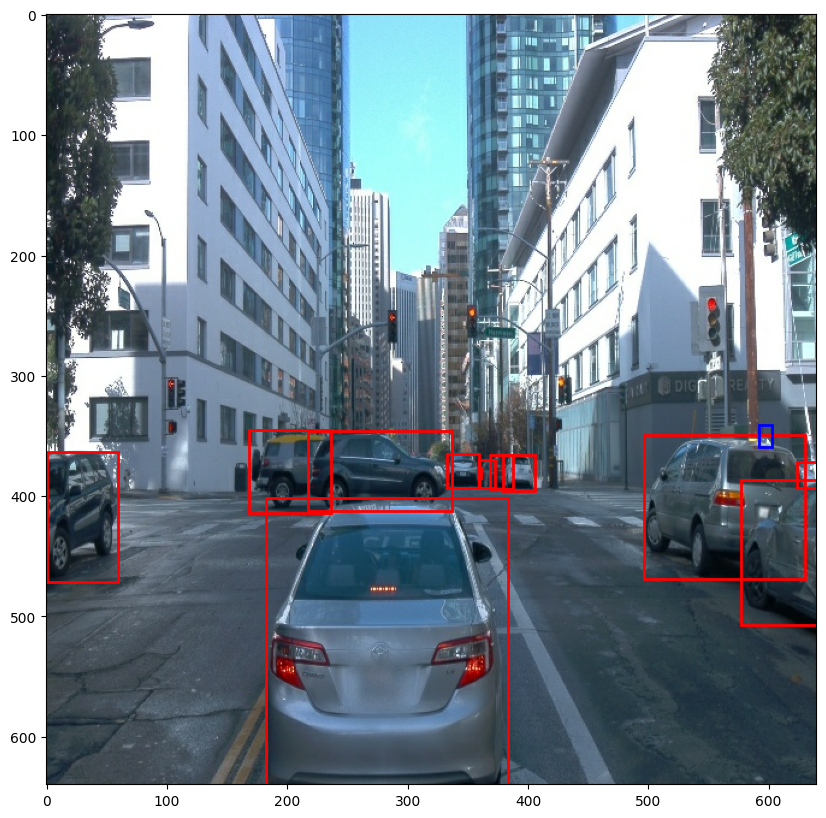

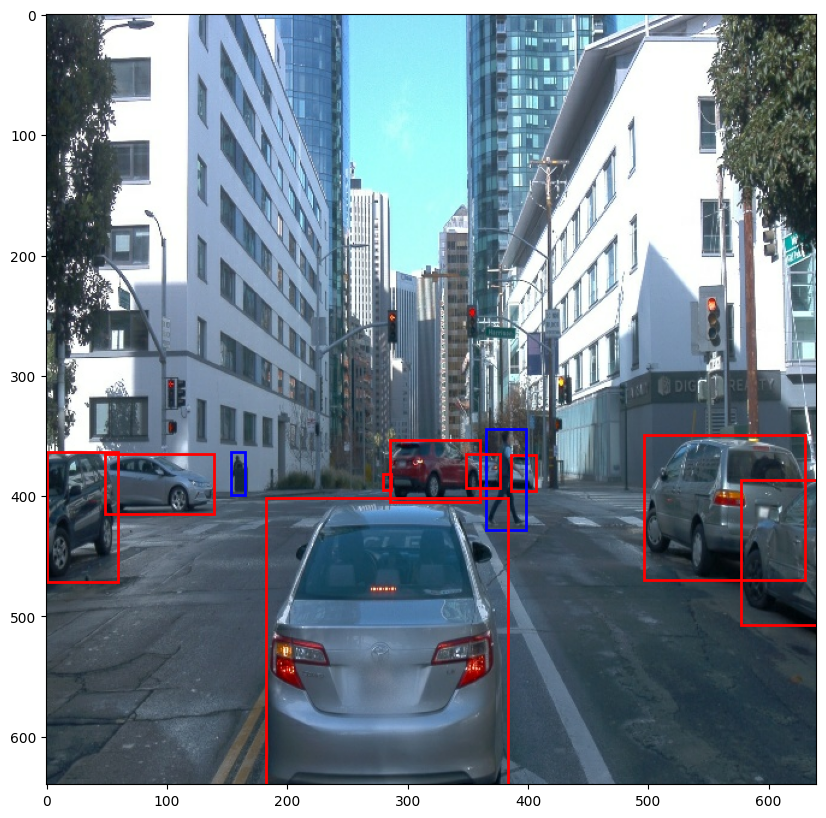

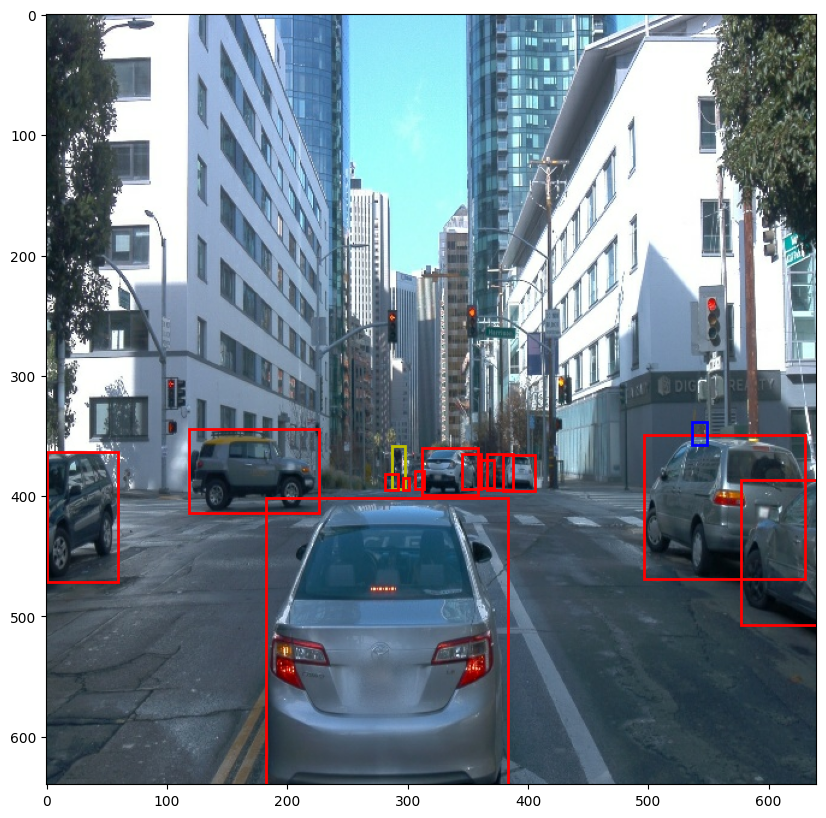

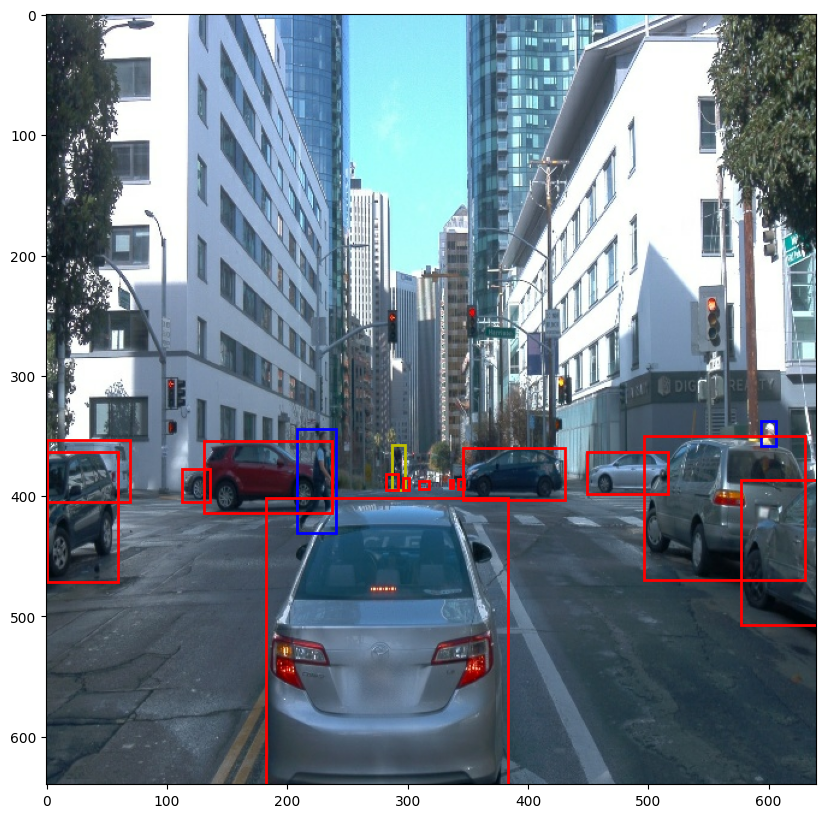

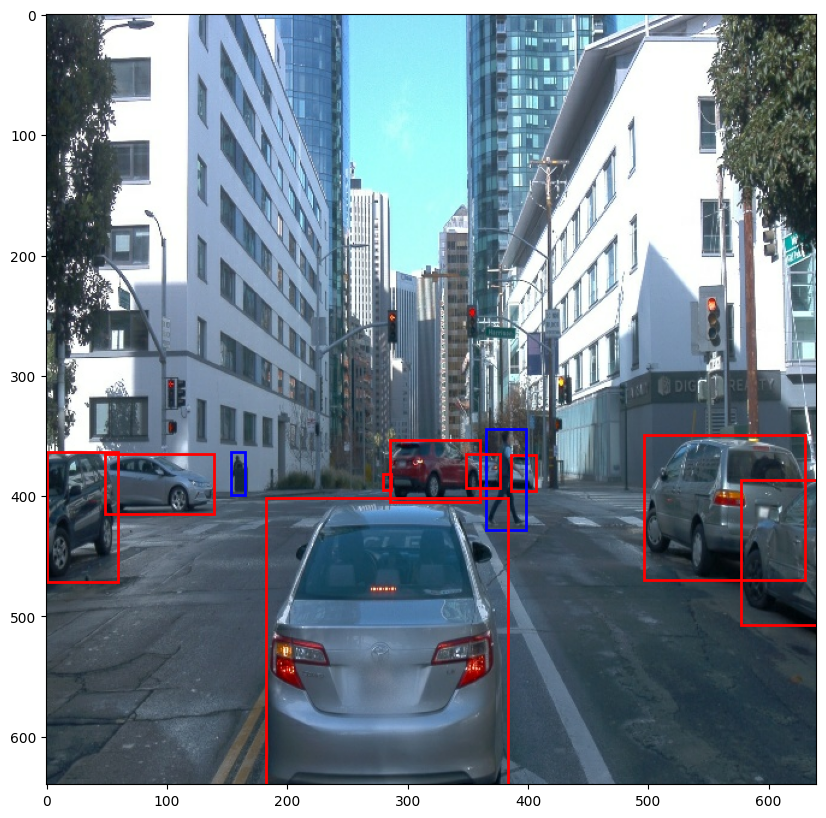

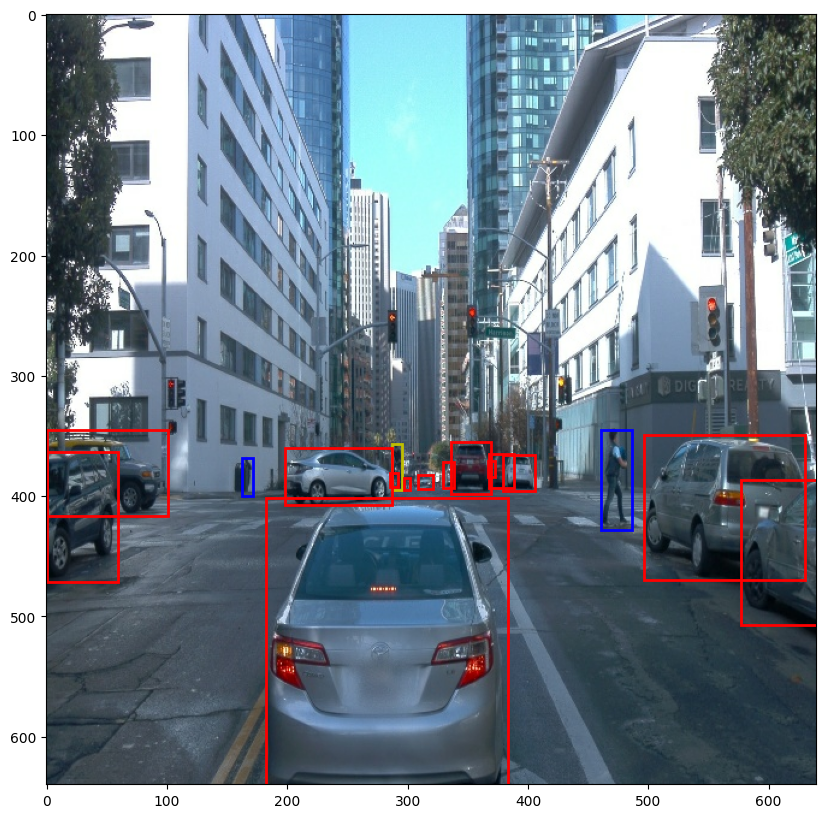

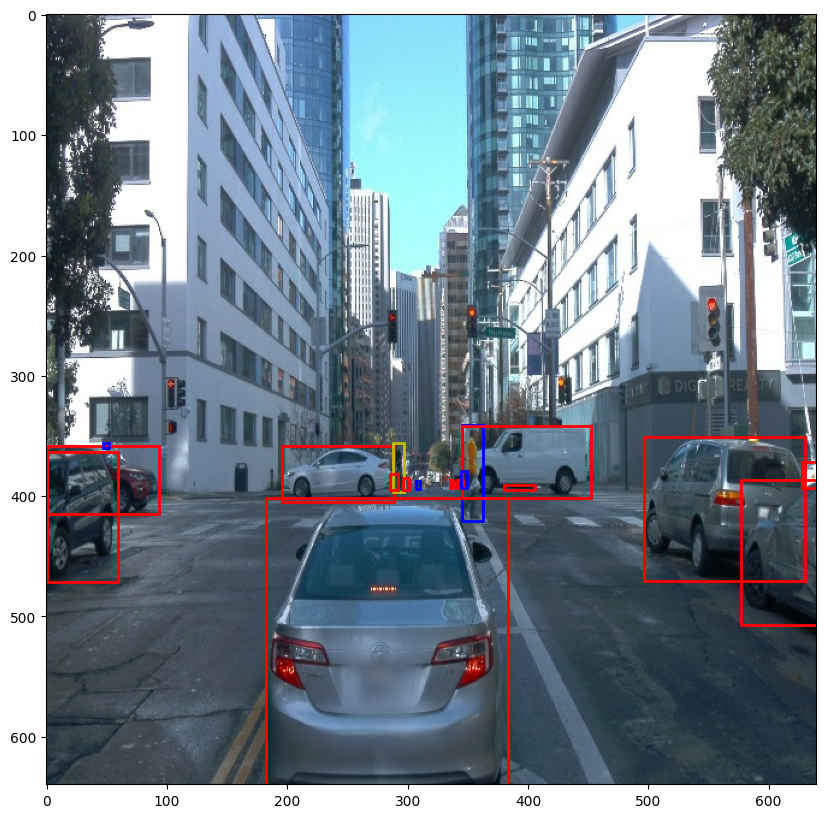

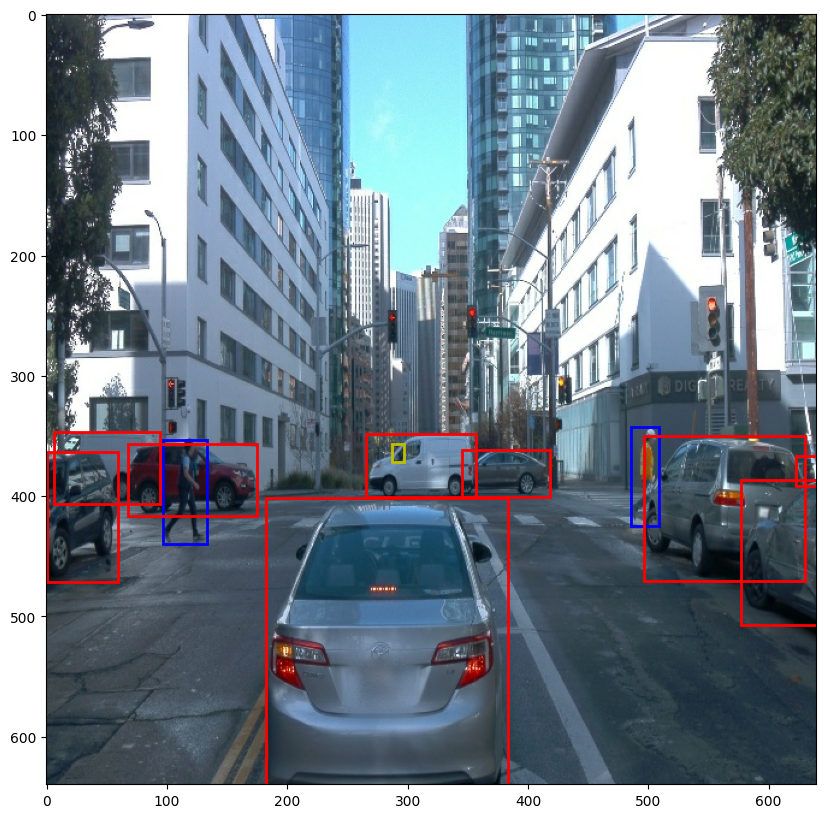

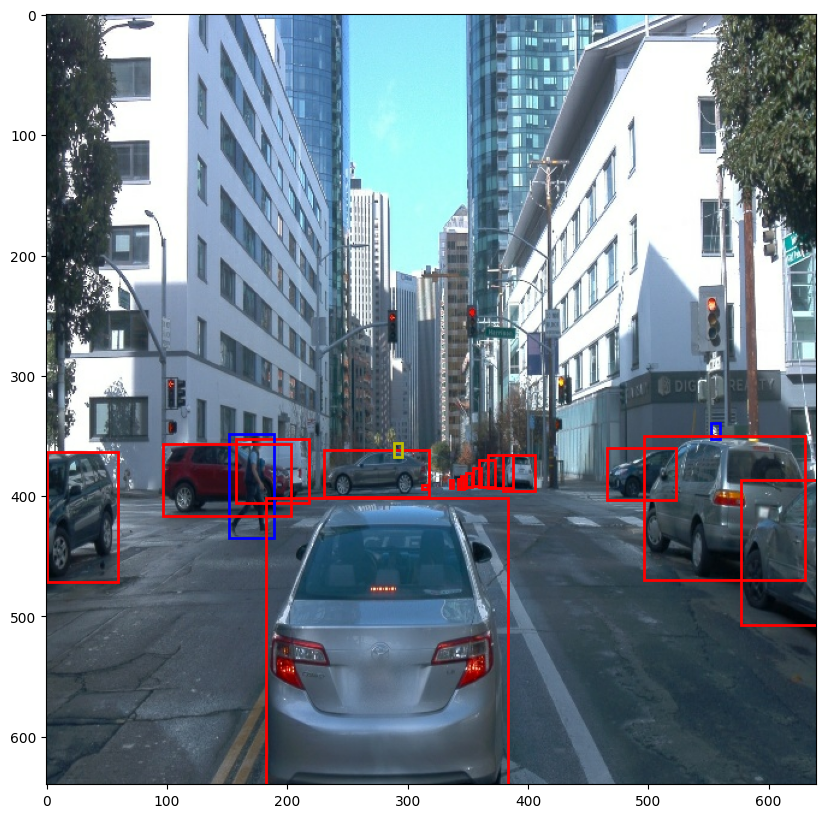

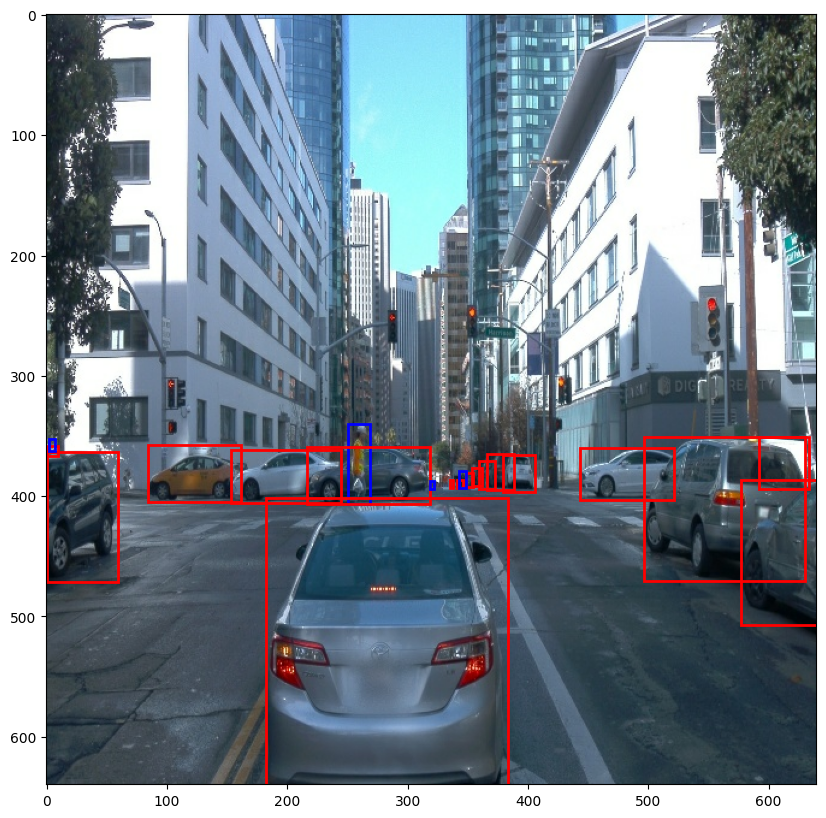

In [13]:
display_instances(batch)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

<BarContainer object of 3 artists>

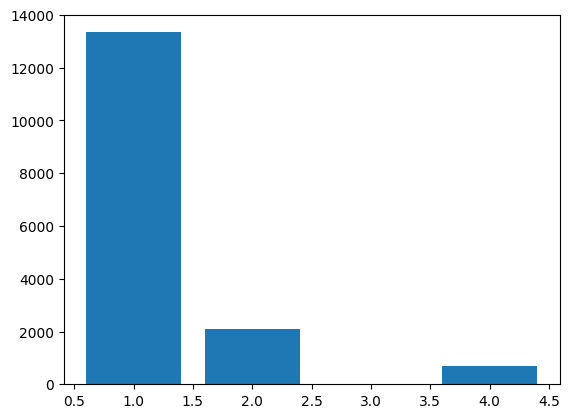

In [15]:
# See class distribution in the dataset
class_count = {}
for b in dataset.shuffle(1000).take(1000):
    classes = b['groundtruth_classes'].numpy()
    for c in classes:
        if c in class_count:
            class_count[c] += 1
        else:
            class_count[c] = 1

# plot class count
plt.bar(class_count.keys(), class_count.values())

(array([109.,  51., 190., 104., 107., 158.,  46.,  41., 109.,  85.]),
 array([ 9., 10., 11., 12., 13., 14., 15., 16., 17., 18., 19.]),
 <BarContainer object of 10 artists>)

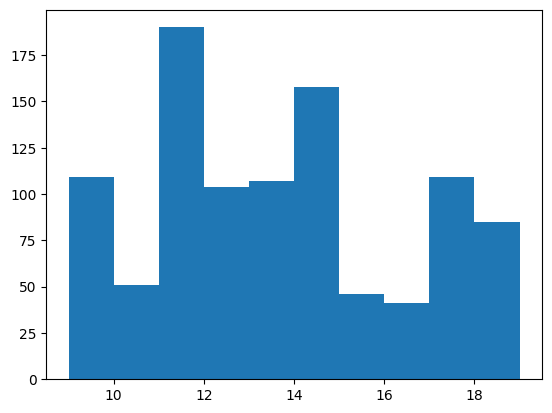

In [19]:
# In each image how many bounding boxes of class 1 are there?
count_1 = []
for b in dataset.shuffle(1000).take(1000):
    classes = b['groundtruth_classes'].numpy()
    classes = [1 if c==1 else 0 for c in classes]
    n_1 = np.sum(classes)
    count_1.append(n_1)


# plot 0 count
plt.hist(count_1)